In [12]:
import pandas as pd
import numpy as np
from app.modules import prep_data, train_model, select_features, build_dset, build_LSTM, build_BLSTM, build_AttentiveBLSTM
from app.modules import gen_test_df, gen_importance_df
from app.modules.lstm import save_model, series_to_supervised, load_model, get_lime_df

from app.api import GoogleTrends
import datetime as dt
import time

import lime
import lime.lime_tabular

## PLOTS

In [13]:
from turtle import width
import plotly.express as px
import plotly.graph_objects as go
import pandas as pd
import lime
import lime.lime_tabular

# To load filtered test predictions
def filter_test_df(test_df, ticker, model_id, pred_scope):

    test_df = test_df.query('Scope==@pred_scope & Ticker==@ticker & Model==@model_id')
    test_df = test_df[['Observed', 'Predicted']]

    return test_df.sort_index()


def plot_model_test(filtered_df: pd.DataFrame, px_theme: str ='plotly_dark'):

    fig = px.line(
            filtered_df,
            x=filtered_df.index, 
            y=filtered_df.columns,
            template=px_theme,
            labels={
                    'variable': ''
                },
            )
    fig.update_layout(
        legend=dict(
            yanchor="top",
            y=0.99,
            xanchor="right",
            x=0.99
        )
    )
    fig.update_yaxes(title_text = 'Close Price')
    fig.update_layout(
        yaxis_tickformat = '$',
        title={
            #'text': "Model Performance",
            'y':0.95,
            'x':0.5,
            'xanchor': 'center',
            'yanchor': 'top',
            'font': dict(
            #family="Courier New, monospace",
            size=25)
            },
        )
    fig.update_traces(hovertemplate='%{y:$,.2f}')
    fig.update_layout(hovermode="x unified")

    fig.update_xaxes(
        title_text = 'Date',
        rangeslider_visible = True
        )
    fig.update_layout(width=750, height=500)
    return fig


def plot_importance(importance_df: pd.DataFrame, px_theme: str ='plotly_dark'):

    fig = go.Figure()
    fig.update_xaxes(showgrid=True, gridwidth=0.1, gridcolor='DarkGrey')

    metrics_list = list(importance_df['Metric'].unique())

    for metric in metrics_list:
        vis = metric == 'mae'
        mdf = importance_df[importance_df['Metric']==metric]

        mdf = mdf.sort_values('Importance').tail(5)
        fig.add_trace(
            go.Bar(
                orientation='h', 
                x = mdf['Importance'],
                y = mdf['Feature'],
                name = metric, 
                visible=vis
            )
        )
                
    buttons = []

    for i, metric in enumerate(metrics_list):
        args = [False] * len(metrics_list)
        args[i] = True
        
        button = dict(
                    label = metric.upper(),
                    method = "update",
                    args=[{"visible": args}])
        
        buttons.append(button)
        
    fig.update_layout(
        updatemenus=[dict(
                        active=0,
                        type="buttons",
                        direction = "left",
                        buttons=buttons,
                        x = 1,
                        y = 1,
                        xanchor = 'left',
                        yanchor = 'bottom'
                    )], 
        autosize=True,
    )
    fig.update_layout(
        title={
            'text': "Error Perturbation",
            'y':0.9,
            'x':0.5,
            'xanchor': 'center',
            'yanchor': 'top',
            'font': dict(
            #family="Courier New, monospace",
            size=25
            )
            },
        template=px_theme
    )

    fig.update_yaxes(tickmode='linear')
    #fig.update_layout(updatemenus=[dict(font=dict(color='gray',), bgcolor='black')])
    fig.update_traces(marker_color='rgba(50, 171, 96, 0.6)')
    fig.update_layout(width=750, height=500)

    return fig

def get_lime_df(model, model_id, X_train, X_test, dsets, test_dates, ticker, scope, yscaler):

    explainer = lime.lime_tabular.RecurrentTabularExplainer(
                                            X_train,
                                            feature_names=list(dsets[ticker + '-USD'].columns),
                                            verbose=True,
                                            mode='regression',
                                            discretize_continuous=False
                                            )

    lime_dfs = []
    for i in range(len(test_dates)):
        exp = explainer.explain_instance(X_test[i], model.predict)
        lime_df = pd.DataFrame(exp.as_list(), columns=['Feature', 'LIME Weight'])
        lime_df['Predicted Close t+'+scope[0]] = yscaler.inverse_transform(lime_df['LIME Weight'].abs().values.reshape(-1,1))[:,0] * (lime_df['LIME Weight'].values//lime_df['LIME Weight'].abs().values)
        lime_df['Date'] = test_dates[i]
        lime_df['Model'] = model_id
        lime_df['Ticker'] = ticker
        lime_df['Scope'] = scope
        lime_dfs.append(lime_df)
    lime_df = pd.concat(lime_dfs)
    lime_df['LIME Weight'] = yscaler.inverse_transform(lime_df['LIME Weight'].abs().values.reshape(-1,1)) * (lime_df['LIME Weight'].values//lime_df['LIME Weight'].abs().values)
        
    lime_df.rename(columns={'Date': 'Date_dt'}, inplace=True)
    lime_df['Date'] = lime_df['Date_dt'].dt.date.apply(lambda x: str(x))
    return lime_df

def plot_lime(lime_df):

    fig = px.bar(
        lime_df, 
        x='LIME Weight', 
        y='Feature',
        animation_frame='Date',
        orientation='h', 
        color='LIME Weight', 
        template='plotly_dark',
        title="LIME - Top Features' Effect on Close t+1",
        color_continuous_scale='viridis',
        )
    fig.update_layout(
            xaxis_tickformat = '$',
            title={
                'y':0.95,
                'x':0.5,
                'xanchor': 'center',
                'yanchor': 'top',
                'font': dict(
                #family="Courier New, monospace",
                size=25)
                },
            )
    fig.update_traces(
        hovertemplate="<br>".join([
            "Feature: %{y}",
            "Contribution: $%{x:,.2f}"])
            )
    fig.show()
    return fig
    

In [14]:
"""COINS_SELECTION = [
    'BTC',
    'ETH',
    'NMC', 
    'FTC', 
    'PPC', 
    'LTC',
]
dset = build_dset(coins_list=COINS_SELECTION, gtrends=True)"""

"COINS_SELECTION = [\n    'BTC',\n    'ETH',\n    'NMC', \n    'FTC', \n    'PPC', \n    'LTC',\n]\ndset = build_dset(coins_list=COINS_SELECTION, gtrends=True)"

## Prepare Data

- Discard redundant features using simple rule based on correlation.
- Scale features with MinMaxScaler
- Reframe the data structure and reshape it to (n_samples, n_timesteps, n_features) such that every sample is a matrix
- Split, we try to use last year as test set, but if we have less data available it could be 6 months for some cryptocurrencies.

## Feature Selection

In [15]:
# Read easier than building everytime
data = pd.read_csv('hist_data_all.csv', parse_dates=['Date'], index_col='Date')
# Build the dataset of pre-selected coins
dsets = {}
for t in list(data.Ticker.unique()):
  df = data.query('Ticker==@t')
  dsets[t] = df[['High', 'Low', 'Volume', 'FVX', 'TNX', 'TYX', 'Gtrend', 'Close']]
dsets['BTC-USD']

,High,Low,Volume,FVX,TNX,TYX,Gtrend,Close
Date,,,,,,,,
2014-09-17,468.174011,452.421997,21056800,1.804,2.600,3.364,47.000,457.334015
2014-09-18,456.859985,413.104004,34483200,1.841,2.629,3.359,47.000,424.440002
2014-09-19,427.834991,384.532013,37919700,1.819,2.587,3.299,53.000,394.795990
2014-09-20,423.295990,389.882996,36863600,1.819,2.587,3.299,46.000,408.903992
2014-09-21,412.425995,393.181000,26580100,1.819,2.587,3.299,48.000,398.821014
...,...,...,...,...,...,...,...,...
2022-06-24,21472.917969,20777.511719,24957784918,3.175,3.125,3.257,47.000,21231.656250
2022-06-25,21520.914062,20964.585938,18372538715,3.175,3.125,3.257,41.000,21502.337891
2022-06-26,21783.724609,21016.269531,18027170497,3.175,3.125,3.257,40.000,21027.294922


In [16]:
dsets.keys()

dict_keys(['BTC-USD', 'ETH-USD', 'LTC-USD', 'NMC-USD', 'PPC-USD', 'FTC-USD'])

In [17]:
# An example of feature correlation
dsets['LTC-USD'].corr()

,High,Low,Volume,FVX,TNX,TYX,Gtrend,Close
High,1.000000,0.995395,0.550188,-0.030481,-0.079392,-0.228810,0.156088,0.997946
Low,0.995395,1.000000,0.532839,-0.027295,-0.081217,-0.236278,0.141117,0.997499
Volume,0.550188,0.532839,1.000000,-0.445127,-0.491198,-0.544325,0.379015,0.544276
FVX,-0.030481,-0.027295,-0.445127,1.000000,0.963404,0.846541,-0.223486,-0.030056
TNX,-0.079392,-0.081217,-0.491198,0.963404,1.000000,0.951779,-0.254424,-0.080994
TYX,-0.228810,-0.236278,-0.544325,0.846541,0.951779,1.000000,-0.260868,-0.232595
Gtrend,0.156088,0.141117,0.379015,-0.223486,-0.254424,-0.260868,1.000000,0.150444
Close,0.997946,0.997499,0.544276,-0.030056,-0.080994,-0.232595,0.150444,1.000000


In [18]:
# Apply simple feature selection
select_features(dsets)
dsets['BTC-USD']

,Gtrend,TYX,Volume,Close
Date,,,,
2014-09-17,47.000,3.364,21056800,457.334015
2014-09-18,47.000,3.359,34483200,424.440002
2014-09-19,53.000,3.299,37919700,394.795990
2014-09-20,46.000,3.299,36863600,408.903992
2014-09-21,48.000,3.299,26580100,398.821014
...,...,...,...,...
2022-06-24,47.000,3.257,24957784918,21231.656250
2022-06-25,41.000,3.257,18372538715,21502.337891
2022-06-26,40.000,3.257,18027170497,21027.294922


In [19]:
timesteps = 60
prep_dsets = {
    coin: prep_data(df, timesteps) for coin, df in dsets.items()
}

(2849, 4)
(1698, 4)
(2849, 4)
(2849, 4)
(2849, 4)
(2849, 4)


# BTC - Bitcoin

In [20]:
cc = 'BTC-USD'
timesteps = 60
ticker = cc[:3]
scope = '1 day ahead'
ticker = cc[:3]
X_train, y_train, X_test, y_test, xscaler, yscaler, test_dates = prep_dsets[cc]
print(X_train.shape, y_train.shape, X_test.shape, y_test.shape)

(2424, 60, 4) (2424,) (365, 60, 4) (365,)


## LSTM Neural Network Architectures

We defined custom architectures for the long short term memory neural networks. Defined as Keras Functional models, they take a series of parameters to customize them in terms of number of Recurrent Neural Layers, the number of units for each one of them, the number of units in the final dense layer, how many steps into the future of the target we are forecasting, and some other parameters such as dropout, learning rate and model name. We have considered 3 types of recurrent neural networks here: a simple LSTM, a bidirectional LSTM and a bidirectional LSTM with attention.

Later, we test different versions of these models, compare them and choose one or two to make it available for the final user.

We tried different combinations of parameters such as the number of lags to include and hyperparameters. We arrived to a couple of base models that will vary in small details across coins and prediction scopes.

## LSTM Model

In [122]:
model_id = 'Deep Learning LSTM'
lstm_model = build_LSTM(
                    (60, 4),
                    num_rnns=2,
                    dim_rnn=100, 
                    dense_units=100, 
                    drop=False, 
                    drop_rate=0.1
                    )
lstm_model = load_model(lstm_model, 'BTC_LSTM_60_lags_4_fts', 'models/')
lstm_tdf = gen_test_df(lstm_model, X_test, y_test, yscaler, ticker='BTC', test_dates=test_dates, lags=timesteps, model_id=model_id, pred_scope=scope)
lstm_tdf = filter_test_df(lstm_tdf, 'BTC', model_id, scope)
plot_model_test(lstm_tdf).show()
lstm_idf = gen_importance_df(lstm_model, dsets['BTC-USD'], timesteps, 'BTC', model_id, scope)
plot_importance(lstm_idf)

12/12 [==============================] - 1s 33ms/step


(2849, 4)


Epoch 1/100
2424/2424 - 53s - loss: 0.0030 - mse: 0.0030 - val_loss: 0.0025 - val_mse: 0.0025 - 53s/epoch - 22ms/step
Epoch 2/100
2424/2424 - 49s - loss: 9.2156e-04 - mse: 9.2156e-04 - val_loss: 0.0080 - val_mse: 0.0080 - 49s/epoch - 20ms/step
Epoch 3/100
2424/2424 - 49s - loss: 7.8157e-04 - mse: 7.8157e-04 - val_loss: 0.0015 - val_mse: 0.0015 - 49s/epoch - 20ms/step
Epoch 4/100
2424/2424 - 49s - loss: 6.9793e-04 - mse: 6.9793e-04 - val_loss: 0.0019 - val_mse: 0.0019 - 49s/epoch - 20ms/step
Epoch 5/100
2424/2424 - 49s - loss: 6.5628e-04 - mse: 6.5628e-04 - val_loss: 0.0014 - val_mse: 0.0014 - 49s/epoch - 20ms/step
Epoch 6/100
2424/2424 - 50s - loss: 4.8067e-04 - mse: 4.8067e-04 - val_loss: 0.0029 - val_mse: 0.0029 - 50s/epoch - 21ms/step
Epoch 7/100
2424/2424 - 49s - loss: 4.9867e-04 - mse: 4.9867e-04 - val_loss: 0.0014 - val_mse: 0.0014 - 49s/epoch - 20ms/step
Epoch 8/100
2424/2424 - 50s - loss: 3.9175e-04 - mse: 3.9175e-04 - val_loss: 0.0044 - val_mse: 0.0044 - 50s/epoch - 20ms/step


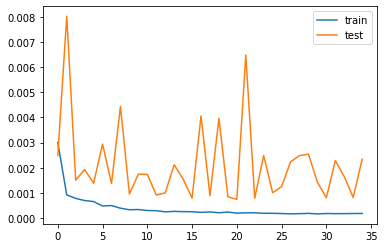

12/12 [==============================] - 1s 25ms/step


(2849, 4)


In [14]:
model_id = 'Deep Learning LSTM'
lstm_model, X_test, y_test, xscaler, yscaler, test_dates = train_model(
                                                                    prep_dsets=prep_dsets, 
                                                                    coin_name=cc, 
                                                                    model_builder=build_LSTM,
                                                                    model_kwargs=dict(
                                                                        num_rnns=2,
                                                                        dim_rnn=100, 
                                                                        dense_units=100, 
                                                                        drop=False, 
                                                                        drop_rate=0.1,
                                                                    ),
                                                                    batch_size=1,
                                                                    n_epochs=100,
                                                                    early_stop=True,
                                                                    patience=30,
                                                                    save=True
                                                                )
lstm_model = load_model(lstm_model, 'BTC_LSTM_60_lags_4_fts', '/models/')
lstm_tdf = gen_test_df(lstm_model, X_test, y_test, yscaler, ticker='BTC', test_dates=test_dates, lags=timesteps, model_id=model_id, pred_scope=scope)
lstm_tdf = filter_test_df(lstm_tdf, 'BTC', model_id, scope)
plot_model_test(lstm_tdf).show()
lstm_idf = gen_importance_df(lstm_model, dsets['BTC-USD'], timesteps, 'BTC', model_id, scope)
plot_importance(lstm_idf)

## BLSTM

Epoch 1/100
2424/2424 - 64s - loss: 0.0038 - mse: 0.0038 - val_loss: 0.0045 - val_mse: 0.0045 - 64s/epoch - 26ms/step
Epoch 2/100
2424/2424 - 60s - loss: 8.7892e-04 - mse: 8.7892e-04 - val_loss: 0.0054 - val_mse: 0.0054 - 60s/epoch - 25ms/step
Epoch 3/100
2424/2424 - 59s - loss: 7.2312e-04 - mse: 7.2312e-04 - val_loss: 0.0028 - val_mse: 0.0028 - 59s/epoch - 24ms/step
Epoch 4/100
2424/2424 - 58s - loss: 6.1978e-04 - mse: 6.1978e-04 - val_loss: 0.0089 - val_mse: 0.0089 - 58s/epoch - 24ms/step
Epoch 5/100
2424/2424 - 60s - loss: 4.7806e-04 - mse: 4.7806e-04 - val_loss: 0.0026 - val_mse: 0.0026 - 60s/epoch - 25ms/step
Epoch 6/100
2424/2424 - 60s - loss: 4.5063e-04 - mse: 4.5063e-04 - val_loss: 0.0050 - val_mse: 0.0050 - 60s/epoch - 25ms/step
Epoch 7/100
2424/2424 - 61s - loss: 4.0324e-04 - mse: 4.0324e-04 - val_loss: 0.0029 - val_mse: 0.0029 - 61s/epoch - 25ms/step
Epoch 8/100
2424/2424 - 59s - loss: 3.2521e-04 - mse: 3.2521e-04 - val_loss: 0.0033 - val_mse: 0.0033 - 59s/epoch - 24ms/step


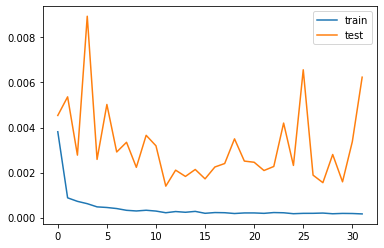

12/12 [==============================] - 1s 12ms/step


(2849, 4)


In [24]:
model_id = 'Bidirectional LSTM'
blstm_model, X_test, y_test, xscaler, yscaler, test_dates = train_model(
                                                                    prep_dsets=prep_dsets, 
                                                                    coin_name=cc, 
                                                                    model_builder=build_BLSTM, 
                                                                    model_kwargs=dict(
                                                                        num_rnns=2,
                                                                        dim_rnn=16, 
                                                                        dense_units=50, 
                                                                        drop=False,
                                                                        drop_rate=0.5
                                                                    ),
                                                                    n_epochs=100,
                                                                    early_stop=True,
                                                                    patience=20,
                                                                    save=True
                                                                )
blstm_tdf = gen_test_df(
    blstm_model, 
    X_test, 
    y_test, 
    yscaler, 
    ticker='BTC', 
    test_dates=test_dates, 
    lags=timesteps, 
    model_id=model_id, 
    pred_scope=scope
    )
blstm_tdf = filter_test_df(
    blstm_tdf, 
    'BTC', 
    model_id, 
    scope
    )
plot_model_test(blstm_tdf).show()
blstm_idf = gen_importance_df(
    blstm_model, 
    dsets['BTC-USD'], 
    timesteps, 
    'BTC', 
    model_id, 
    scope
    )
plot_importance(blstm_idf)

In [44]:
preds_df = pd.concat([lstm_tdf, blstm_tdf])
preds_df.to_csv('./models/predictions.csv', index=True)

imp_df = pd.concat([lstm_idf, blstm_idf])
imp_df.to_csv('./models/ft_importance.csv', index=False)

## Attentive BLSTM

In [ ]:
model_id = 'Attentive Bidirectional LSTM'
ablstm_model, X_test, y_test, xscaler, yscaler, test_dates = train_model(
                                                                    prep_dsets=prep_dsets, 
                                                                    coin_name=cc, 
                                                                    model_builder=build_AttentiveBLSTM,
                                                                    model_kwargs=dict(
                                                                        num_rnns=2,
                                                                        dim_rnn=32,
                                                                        drop=False, 
                                                                        drop_rate=0.5,
                                                                        suffix='5RNN_d50'
                                                                    ),
                                                                    n_epochs=30,
                                                                    early_stop=True,
                                                                    patience=10    
                                                                )
ablstm_tdf = gen_test_df(
    ablstm_model, 
    X_test, 
    y_test, 
    yscaler, 
    ticker='BTC', 
    test_dates=test_dates, 
    lags=timesteps, 
    model_id=model_id, 
    pred_scope=scope
    )
ablstm_tdf = filter_test_df(
    ablstm_tdf, 
    'BTC', 
    model_id, 
    scope
    )
plot_model_test(ablstm_tdf).show()
ablstm_idf = gen_importance_df(
    ablstm_model, 
    dsets['BTC-USD'], 
    timesteps, 
    'BTC', 
    model_id, 
    scope
    )
plot_importance(ablstm_idf)

In [ ]:
lstm_model = build_LSTM(
    (60, 4),
    num_rnns=2,
    dim_rnn=16, 
    dense_units=50, 
    drop=False,
    drop_rate=0.5
)
bblstm_model = load_model(bblstm_model, 'BTC_Bidirectional_LSTM_60_lags_4_fts', './app/dashboard/test_models/')    
bblstm_idf = gen_importance_df(bblstm_model, dsets['BTC-USD'], timesteps, 'BTC', 'Bidirectional LSTM', scope)
plot_importance(bblstm_idf)      

In [23]:
lstm_model = build_LSTM(
        (60, 4),
        num_rnns=2,
        dim_rnn=100, 
        dense_units=100, 
        drop=False, 
        drop_rate=0.1,
    )
lstm_idf = gen_importance_df(lstm_model, dsets['BTC-USD'], timesteps, 'BTC', 'Deep Learning LSTM', scope)
plot_importance(lstm_idf)                                                

(2849, 4)


In [22]:
bblstm_model = build_BLSTM(
    (60, 4),
    num_rnns=2,
    dim_rnn=16, 
    dense_units=50, 
    drop=False,
    drop_rate=0.5
)
bblstm_model = load_model(bblstm_model, 'BTC_Bidirectional_LSTM_60_lags_4_fts', './app/dashboard/test_models/')    
bblstm_idf = gen_importance_df(bblstm_model, dsets['BTC-USD'], timesteps, 'BTC', 'Bidirectional LSTM', scope)
plot_importance(bblstm_idf)                                                

(2849, 4)


In [24]:
btc_idf = pd.concat([lstm_idf, bblstm_idf])
btc_idf.to_csv('./models/ft_importance.csv')

## Explainable Forecast

We use LIME methodology to make our deep learning models more interpretable. Here, we get the most relevant features at different time steps and their contributions for a single sample prediction. Below, we get the top 10 features contributing to the final prediction for a recent date. This will let us understand the most relevant factors and their influence on the price at different points of time.

**EXPLICAR MEJOR LIME!!**

In [ ]:
%%capture
%pip install lime

In [98]:


explainer = lime.lime_tabular.RecurrentTabularExplainer(
    X_train,
    feature_names=list(dsets['BTC-USD'].columns),
    verbose=True,
    mode='regression',
    discretize_continuous=False
    )
i = np.argmin(y_test.reshape(365))
exp = explainer.explain_instance(X_test[i], bblstm_model.predict)
exp.show_in_notebook()

157/157 [==============================] - 2s 12ms/step
Intercept 0.07949676992320218
Prediction_local [0.19252553]
Right: 0.19942684


In [70]:
lime_df = pd.DataFrame(exp.as_list(), columns=['Feature', 'LIME Weight'])
px.bar(
    lime_df, 
    x='LIME Weight', 
    y='Feature', 
    orientation='h', 
    color='LIME Weight', 
    template='plotly_white',
    title='LIME - Feature Effect on Close t+1',
    color_continuous_scale='viridis'
    )

In [101]:
(yscaler.inverse_transform(lime_df['LIME Weight'].abs().values.reshape(-1,1))[:,0] * (lime_df['LIME Weight'].values//lime_df['LIME Weight'].abs().values)).sum()

7736.427088188967

In [106]:
lime_df['LIME Weight'].sum() + exp.intercept[0]

0.18901391957248537

We get the lime estimate of feature contribution to the cryptocurrency price for each one of the test samples, giving us the top 10 features and their direct effect on the forecast. Thus, making the model explainable across time.

In [133]:
def get_lime_df(model, model_id, X_train, X_test, dsets, test_dates, ticker, scope, yscaler):

    explainer = lime.lime_tabular.RecurrentTabularExplainer(
                                            X_train,
                                            feature_names=list(dsets[ticker + '-USD'].columns),
                                            verbose=True,
                                            mode='regression',
                                            discretize_continuous=False
                                            )

    lime_dfs = []
    for i in range(len(test_dates)):
        exp = explainer.explain_instance(X_test[i], model.predict)
        lime_df = pd.DataFrame(exp.as_list(), columns=['Feature', 'LIME Weight'])
        lime_df['Predicted Close t+'+scope[0]] = yscaler.inverse_transform(lime_df['LIME Weight'].abs().values.reshape(-1,1))[:,0] * (lime_df['LIME Weight'].values//lime_df['LIME Weight'].abs().values)
        lime_df['Date'] = test_dates[i]
        lime_df['Model'] = model_id
        lime_df['Ticker'] = ticker
        lime_df['Scope'] = scope
        lime_dfs.append(lime_df)
    lime_df = pd.concat(lime_dfs)
    lime_df['LIME Weight'] = yscaler.inverse_transform(lime_df['LIME Weight'].values.reshape(-1,1))
    lime_df.rename(columns={'Date': 'Date_dt'}, inplace=True)
    lime_df['Date'] = lime_df['Date_dt'].dt.date.apply(lambda x: str(x))
    return lime_df

In [123]:
lstm_ldf = get_lime_df(lstm_model, 'Deep Learning LSTM', X_train, X_test, dsets, test_dates, ticker, scope, yscaler)

157/157 [==============================] - 5s 32ms/step
Intercept 0.12316798857208984
Prediction_local [0.40164299]
Right: 0.48853472
157/157 [==============================] - 5s 34ms/step
Intercept 0.12308562672142696
Prediction_local [0.41208688]
Right: 0.49539533
157/157 [==============================] - 5s 34ms/step
Intercept 0.12284063433688004
Prediction_local [0.40693295]
Right: 0.4916888
157/157 [==============================] - 5s 32ms/step
Intercept 0.12324066531098729
Prediction_local [0.403748]
Right: 0.48858064
157/157 [==============================] - 5s 34ms/step
Intercept 0.12301843807374165
Prediction_local [0.4015109]
Right: 0.48916122
157/157 [==============================] - 5s 34ms/step
Intercept 0.1230201921760399
Prediction_local [0.40229143]
Right: 0.4932639
157/157 [==============================] - 5s 32ms/step
Intercept 0.12288040729174983
Prediction_local [0.39624855]
Right: 0.48988608
157/157 [==============================] - 5s 32ms/step
Intercept 0.

In [78]:
blstm_ldf = get_lime_df(bblstm_model, 'Bidirectional LSTM',X_train, X_test, dsets, test_dates, ticker, scope, yscaler)

157/157 [==============================] - 2s 11ms/step
Intercept 0.07972324957707544
Prediction_local [0.42496342]
Right: 0.4707762
157/157 [==============================] - 2s 11ms/step
Intercept 0.07973124639787957
Prediction_local [0.43679179]
Right: 0.475101
157/157 [==============================] - 2s 11ms/step
Intercept 0.080234700473186
Prediction_local [0.42083084]
Right: 0.46523824
157/157 [==============================] - 2s 10ms/step
Intercept 0.08007218380546086
Prediction_local [0.41258729]
Right: 0.4610534
157/157 [==============================] - 2s 11ms/step
Intercept 0.07961358325153733
Prediction_local [0.41533765]
Right: 0.46535683
157/157 [==============================] - 2s 11ms/step
Intercept 0.07985403361099673
Prediction_local [0.41985777]
Right: 0.47555462
157/157 [==============================] - 2s 10ms/step
Intercept 0.07991760337440665
Prediction_local [0.41311825]
Right: 0.47160956
157/157 [==============================] - 2s 10ms/step
Intercept 0.

In [141]:
blstm_ldf['Date'] = blstm_ldf['Date'].dt.date.apply(lambda x: str(x))
#lime_all = pd.concat([lstm_ldf, blstm_ldf])
#lime_all.to_csv('./models/lime_weights.csv', index=False)

In [130]:
pd.read_csv('./models/lime_weights.csv')

,Feature,LIME Weight,Predicted Close t+1,Date_dt,Model,Ticker,Scope,Date
0,Close_t-1,1605.482966,1605.482966,2021-06-30,Deep Learning LSTM,BTC,1 day ahead,2021-06-30
1,Close_t-0,1554.365202,1554.365202,2021-06-30,Deep Learning LSTM,BTC,1 day ahead,2021-06-30
2,Close_t-2,1437.950205,1437.950205,2021-06-30,Deep Learning LSTM,BTC,1 day ahead,2021-06-30
3,Close_t-3,1193.524599,1193.524599,2021-06-30,Deep Learning LSTM,BTC,1 day ahead,2021-06-30
4,Close_t-4,971.324628,971.324628,2021-06-30,Deep Learning LSTM,BTC,1 day ahead,2021-06-30
...,...,...,...,...,...,...,...,...
7295,TYX_t-0,-116.004449,-472.210442,2022-06-28,Bidirectional LSTM,BTC,1 day ahead,2022-06-28
7296,TYX_t-1,9.014965,-347.191028,2022-06-28,Bidirectional LSTM,BTC,1 day ahead,2022-06-28
7297,Gtrend_t-0,37.066723,-319.139270,2022-06-28,Bidirectional LSTM,BTC,1 day ahead,2022-06-28
7298,Close_t-59,293.631683,293.631683,2022-06-28,Bidirectional LSTM,BTC,1 day ahead,2022-06-28


In [16]:
def plot_lime(lime_df):

    fig = px.bar(
        lime_df, 
        x='LIME Weight', 
        y='Feature',
        animation_frame='Date',
        orientation='h', 
        color='LIME Weight', 
        template='plotly_dark',
        title="LIME - Top Features' Effect on Close t+1",
        color_continuous_scale='viridis',
        )
    fig.update_layout(
            xaxis_tickformat = '$',
            title={
                'y':0.95,
                'x':0.5,
                'xanchor': 'center',
                'yanchor': 'top',
                'font': dict(
                #family="Courier New, monospace",
                size=25)
                },
            )
    fig.update_traces(
        hovertemplate="<br>".join([
            "Feature: %{y}",
            "Contribution: $%{x:,.2f}"])
            )

    fig.show()

In [143]:
plot_lime(lstm_ldf)

In [142]:
plot_lime(blstm_ldf)

# ETH - Ethereum

#### Prepare Data and Take a look at Selected Features

In [10]:
cc = 'ETH-USD'
timesteps = 60
scope = '1 day ahead'
ticker = cc[:3]
X_train, y_train, X_test, y_test, xscaler, yscaler, test_dates = prep_dsets[cc]
print(X_train.shape, y_train.shape, X_test.shape, y_test.shape)

(1518, 60, 4) (1518,) (120, 60, 4) (120,)


In [11]:
dsets[cc]

,FVX,Gtrend,Volume,Close
Date,,,,
2017-11-09,2.003,26.000000,893249984,320.884003
2017-11-10,2.055,22.000000,885985984,299.252991
2017-11-11,2.055,19.000000,842300992,314.681000
2017-11-12,2.055,20.000000,1613479936,307.907990
2017-11-13,2.072,20.000000,1041889984,316.716003
...,...,...,...,...
2022-06-24,3.175,46.000000,16981552654,1226.844727
2022-06-25,3.175,42.000000,12481946184,1243.446899
2022-06-26,3.175,40.000000,12096607824,1199.831665


## LSTM

Epoch 1/100
1518/1518 - 49s - loss: 0.0057 - mse: 0.0057 - val_loss: 0.0052 - val_mse: 0.0052 - 49s/epoch - 32ms/step
Epoch 2/100
1518/1518 - 47s - loss: 0.0018 - mse: 0.0018 - val_loss: 0.0014 - val_mse: 0.0014 - 47s/epoch - 31ms/step
Epoch 3/100
1518/1518 - 46s - loss: 0.0018 - mse: 0.0018 - val_loss: 0.0012 - val_mse: 0.0012 - 46s/epoch - 31ms/step
Epoch 4/100
1518/1518 - 47s - loss: 0.0015 - mse: 0.0015 - val_loss: 0.0013 - val_mse: 0.0013 - 47s/epoch - 31ms/step
Epoch 5/100
1518/1518 - 47s - loss: 0.0016 - mse: 0.0016 - val_loss: 8.2319e-04 - val_mse: 8.2319e-04 - 47s/epoch - 31ms/step
Epoch 6/100
1518/1518 - 48s - loss: 0.0011 - mse: 0.0011 - val_loss: 0.0022 - val_mse: 0.0022 - 48s/epoch - 32ms/step
Epoch 7/100
1518/1518 - 46s - loss: 7.6824e-04 - mse: 7.6824e-04 - val_loss: 6.6464e-04 - val_mse: 6.6464e-04 - 46s/epoch - 30ms/step
Epoch 8/100
1518/1518 - 48s - loss: 7.6675e-04 - mse: 7.6675e-04 - val_loss: 0.0039 - val_mse: 0.0039 - 48s/epoch - 32ms/step
Epoch 9/100
1518/1518 - 

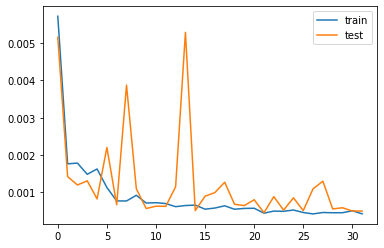

4/4 [==============================] - 0s 36ms/step


(1698, 4)


In [13]:
model_id = 'Deep Learning LSTM'
lstm_model, X_test, y_test, xscaler, yscaler, test_dates = train_model(
                                                                    prep_dsets=prep_dsets, 
                                                                    coin_name=cc, 
                                                                    model_builder=build_LSTM,
                                                                    model_kwargs=dict(
                                                                        num_rnns=2,
                                                                        dim_rnn=200, 
                                                                        dense_units=100, 
                                                                        drop=False, 
                                                                        drop_rate=0.3,
                                                                    ),
                                                                    batch_size=1,
                                                                    n_epochs=100,
                                                                    early_stop=True,
                                                                    patience=30,
                                                                    save=True
                                                                )
lstm_tdf = gen_test_df(
    lstm_model, 
    X_test, y_test, 
    yscaler, 
    ticker=ticker, 
    test_dates=test_dates, 
    lags=timesteps, 
    model_id=model_id, 
    pred_scope=scope
    )
lstm_tdf = filter_test_df(lstm_tdf, ticker, model_id, scope)
plot_model_test(lstm_tdf).show()
lstm_idf = gen_importance_df(lstm_model, dsets[cc], timesteps, ticker, model_id, scope)
plot_importance(lstm_idf)

### LIME Explainable

## BLSTM

Epoch 1/100
1518/1518 - 39s - loss: 0.0049 - mse: 0.0049 - val_loss: 0.0066 - val_mse: 0.0066 - 39s/epoch - 25ms/step
Epoch 2/100
1518/1518 - 35s - loss: 0.0017 - mse: 0.0017 - val_loss: 0.0062 - val_mse: 0.0062 - 35s/epoch - 23ms/step
Epoch 3/100
1518/1518 - 35s - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0033 - val_mse: 0.0033 - 35s/epoch - 23ms/step
Epoch 4/100
1518/1518 - 35s - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0019 - val_mse: 0.0019 - 35s/epoch - 23ms/step
Epoch 5/100
1518/1518 - 35s - loss: 9.1139e-04 - mse: 9.1139e-04 - val_loss: 0.0058 - val_mse: 0.0058 - 35s/epoch - 23ms/step
Epoch 6/100
1518/1518 - 35s - loss: 8.8394e-04 - mse: 8.8394e-04 - val_loss: 0.0018 - val_mse: 0.0018 - 35s/epoch - 23ms/step
Epoch 7/100
1518/1518 - 35s - loss: 0.2176 - mse: 0.2176 - val_loss: 0.0031 - val_mse: 0.0031 - 35s/epoch - 23ms/step
Epoch 8/100
1518/1518 - 35s - loss: 7.2779e-04 - mse: 7.2779e-04 - val_loss: 0.0023 - val_mse: 0.0023 - 35s/epoch - 23ms/step
Epoch 9/100
1518/1518 - 35s - lo

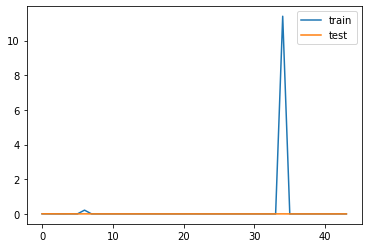

4/4 [==============================] - 1s 15ms/step


(1698, 4)


In [14]:
model_id = 'Bidirectional LSTM'
blstm_model, X_test, y_test, xscaler, yscaler, test_dates = train_model(
                                                                    prep_dsets=prep_dsets, 
                                                                    coin_name=cc, 
                                                                    model_builder=build_BLSTM, 
                                                                    model_kwargs=dict(
                                                                        num_rnns=2,
                                                                        dim_rnn=32, 
                                                                        dense_units=50, 
                                                                        drop=False,
                                                                        drop_rate=0.5
                                                                    ),
                                                                    n_epochs=100,
                                                                    early_stop=True,
                                                                    patience=20,
                                                                    save=True
                                                                )
blstm_tdf = gen_test_df(
    blstm_model, 
    X_test, 
    y_test, 
    yscaler, 
    ticker=ticker, 
    test_dates=test_dates, 
    lags=timesteps, 
    model_id=model_id, 
    pred_scope=scope
    )
blstm_tdf = filter_test_df(
    blstm_tdf, 
    ticker, 
    model_id, 
    scope
    )
plot_model_test(blstm_tdf).show()
blstm_idf = gen_importance_df(
    blstm_model, 
    dsets[cc], 
    timesteps, 
    ticker, 
    model_id, 
    scope
    )
plot_importance(blstm_idf)

### LIME Explainable

In [28]:
lstm_ldf = get_lime_df(lstm_model, 'Deep Learning LSTM', X_train, X_test, dsets, test_dates, ticker, scope, yscaler)
blstm_ldf = get_lime_df(blstm_model, 'Bidirectional LSTM', X_train, X_test, dsets, test_dates, ticker, scope, yscaler)
pd.concat([lstm_ldf, blstm_ldf]).to_csv('./models/other_tested/ETH_lime.csv', index=False)
pd.concat([lstm_idf, blstm_idf]).to_csv('./models/other_tested/ETH_fimp.csv', index=False)
pd.concat([lstm_tdf, blstm_tdf]).to_csv('./models/other_tested/ETH_preds.csv')

157/157 [==============================] - 7s 47ms/step
Intercept 0.19929669018451748
Prediction_local [0.55411257]
Right: 0.5668349
157/157 [==============================] - 7s 47ms/step
Intercept 0.19927981798917374
Prediction_local [0.56634077]
Right: 0.58015054
157/157 [==============================] - 7s 47ms/step
Intercept 0.19915782317274877
Prediction_local [0.57412573]
Right: 0.5901204
157/157 [==============================] - 7s 47ms/step
Intercept 0.1992485331753204
Prediction_local [0.57833048]
Right: 0.5924348
157/157 [==============================] - 7s 47ms/step
Intercept 0.19967194150621456
Prediction_local [0.58178047]
Right: 0.58505297
157/157 [==============================] - 7s 47ms/step
Intercept 0.1993079071402755
Prediction_local [0.57862692]
Right: 0.5753119
157/157 [==============================] - 7s 47ms/step
Intercept 0.19984422898644486
Prediction_local [0.56882757]
Right: 0.5634533
157/157 [==============================] - 7s 47ms/step
Intercept 0.1

In [29]:
blstm_ldf[blstm_ldf['LIME Weight']<0]

,Feature,LIME Weight,Predicted Close t+1,Date_dt,Model,Ticker,Scope,Date


In [30]:
plot_lime(lstm_ldf)
plot_lime(blstm_ldf)

# LTC - Litecoin

In [56]:
cc = 'LTC-USD'
timesteps = 60
scope = '1 day ahead'
ticker = cc[:3]
X_train, y_train, X_test, y_test, xscaler, yscaler, test_dates = prep_dsets[cc]
print(X_train.shape, y_train.shape, X_test.shape, y_test.shape)
dsets[cc]

(2424, 60, 4) (2424,) (365, 60, 4) (365,)


,TYX,Gtrend,Volume,Close
Date,,,,
2014-09-17,3.364,69.000000,3071840,5.058550
2014-09-18,3.359,85.000000,4569260,4.685230
2014-09-19,3.299,56.000000,3917450,4.327770
2014-09-20,3.299,59.000000,5490660,4.286440
2014-09-21,3.299,71.000000,2931220,4.245920
...,...,...,...,...
2022-06-24,3.257,40.000000,589158085,55.992283
2022-06-25,3.257,49.000000,560628121,58.969929
2022-06-26,3.257,48.000000,486759815,56.876144


## LSTM

Epoch 1/100
2424/2424 - 156s - loss: 0.0053 - mse: 0.0053 - val_loss: 0.0035 - val_mse: 0.0035 - 156s/epoch - 64ms/step
Epoch 2/100
2424/2424 - 147s - loss: 0.0027 - mse: 0.0027 - val_loss: 0.0018 - val_mse: 0.0018 - 147s/epoch - 60ms/step
Epoch 3/100
2424/2424 - 152s - loss: 0.0019 - mse: 0.0019 - val_loss: 0.0128 - val_mse: 0.0128 - 152s/epoch - 63ms/step
Epoch 4/100
2424/2424 - 153s - loss: 0.0021 - mse: 0.0021 - val_loss: 0.0022 - val_mse: 0.0022 - 153s/epoch - 63ms/step
Epoch 5/100
2424/2424 - 151s - loss: 0.0017 - mse: 0.0017 - val_loss: 0.0021 - val_mse: 0.0021 - 151s/epoch - 62ms/step
Epoch 6/100
2424/2424 - 148s - loss: 0.0018 - mse: 0.0018 - val_loss: 0.0020 - val_mse: 0.0020 - 148s/epoch - 61ms/step
Epoch 7/100
2424/2424 - 149s - loss: 0.0014 - mse: 0.0014 - val_loss: 0.0011 - val_mse: 0.0011 - 149s/epoch - 62ms/step
Epoch 8/100
2424/2424 - 146s - loss: 0.0014 - mse: 0.0014 - val_loss: 0.0018 - val_mse: 0.0018 - 146s/epoch - 60ms/step
Epoch 9/100
2424/2424 - 149s - loss: 0.0

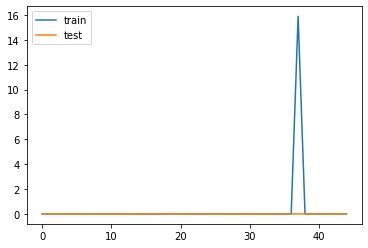

12/12 [==============================] - 2s 145ms/step


(2849, 4)


In [57]:
model_id = 'Deep Learning LSTM'
lstm_model, X_test, y_test, xscaler, yscaler, test_dates = train_model(
                                                                    prep_dsets=prep_dsets, 
                                                                    coin_name=cc, 
                                                                    model_builder=build_LSTM,
                                                                    model_kwargs=dict(
                                                                        num_rnns=2,
                                                                        dim_rnn=200, 
                                                                        dense_units=100, 
                                                                        drop=True, 
                                                                        drop_rate=0.3,
                                                                    ),
                                                                    batch_size=1,
                                                                    n_epochs=100,
                                                                    early_stop=True,
                                                                    patience=30,
                                                                    save=True
                                                                )
lstm_tdf = gen_test_df(
    lstm_model, 
    X_test, y_test, 
    yscaler, 
    ticker=ticker, 
    test_dates=test_dates, 
    lags=timesteps, 
    model_id=model_id, 
    pred_scope=scope
    )
lstm_tdf = filter_test_df(lstm_tdf, ticker, model_id, scope)
plot_model_test(lstm_tdf).show()
lstm_idf = gen_importance_df(lstm_model, dsets[cc], timesteps, ticker, model_id, scope)
plot_importance(lstm_idf)

## BLSTM

Epoch 1/30
2424/2424 - 64s - loss: 0.5985 - mse: 0.5985 - val_loss: 0.0057 - val_mse: 0.0057 - 64s/epoch - 26ms/step
Epoch 2/30
2424/2424 - 62s - loss: 0.0036 - mse: 0.0036 - val_loss: 0.0041 - val_mse: 0.0041 - 62s/epoch - 26ms/step
Epoch 3/30
2424/2424 - 61s - loss: 0.0028 - mse: 0.0028 - val_loss: 0.0031 - val_mse: 0.0031 - 61s/epoch - 25ms/step
Epoch 4/30
2424/2424 - 62s - loss: 0.0017 - mse: 0.0017 - val_loss: 0.0022 - val_mse: 0.0022 - 62s/epoch - 25ms/step
Epoch 5/30
2424/2424 - 60s - loss: 0.0017 - mse: 0.0017 - val_loss: 0.0042 - val_mse: 0.0042 - 60s/epoch - 25ms/step
Epoch 6/30
2424/2424 - 61s - loss: 0.0016 - mse: 0.0016 - val_loss: 0.0071 - val_mse: 0.0071 - 61s/epoch - 25ms/step
Epoch 7/30
2424/2424 - 60s - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0088 - val_mse: 0.0088 - 60s/epoch - 25ms/step
Epoch 8/30
2424/2424 - 61s - loss: 0.0011 - mse: 0.0011 - val_loss: 0.0147 - val_mse: 0.0147 - 61s/epoch - 25ms/step
Epoch 9/30
2424/2424 - 62s - loss: 0.0013 - mse: 0.0013 - val_lo

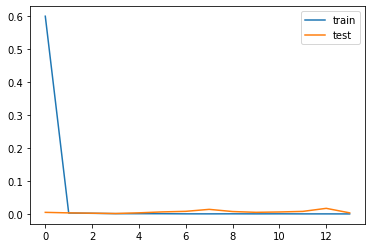

12/12 [==============================] - 1s 15ms/step


(2849, 4)


In [58]:
model_id = 'Bidirectional LSTM'
blstm_model, X_test, y_test, xscaler, yscaler, test_dates = train_model(
                                                                    prep_dsets=prep_dsets, 
                                                                    coin_name=cc, 
                                                                    model_builder=build_BLSTM, 
                                                                    model_kwargs=dict(
                                                                        num_rnns=2,
                                                                        dim_rnn=16, 
                                                                        dense_units=50, 
                                                                        drop=True,
                                                                        drop_rate=0.3
                                                                    ),
                                                                    n_epochs=30,
                                                                    early_stop=True,
                                                                    patience=10,
                                                                    save=True
                                                                )
blstm_tdf = gen_test_df(
    blstm_model, 
    X_test, 
    y_test, 
    yscaler, 
    ticker=ticker, 
    test_dates=test_dates, 
    lags=timesteps, 
    model_id=model_id, 
    pred_scope=scope
    )
blstm_tdf = filter_test_df(
    blstm_tdf, 
    ticker, 
    model_id, 
    scope
    )
plot_model_test(blstm_tdf).show()
blstm_idf = gen_importance_df(
    blstm_model, 
    dsets[cc], 
    timesteps, 
    ticker, 
    model_id, 
    scope
    )
plot_importance(blstm_idf)

## Interpretable Models with LIME

In [59]:
lstm_ldf = get_lime_df(lstm_model, 'Deep Learning LSTM', X_train, X_test, dsets, test_dates, ticker, scope, yscaler)
blstm_ldf = get_lime_df(blstm_model, 'Bidirectional LSTM', X_train, X_test, dsets, test_dates, ticker, scope, yscaler)
pd.concat([lstm_ldf, blstm_ldf]).to_csv('./models/other_tested/{}_lime.csv'.format(ticker), index=False)
pd.concat([lstm_idf, blstm_idf]).to_csv('./models/other_tested/{}_fimp.csv'.format(ticker), index=False)
pd.concat([lstm_tdf, blstm_tdf]).to_csv('./models/other_tested/{}_preds.csv'.format(ticker))
plot_lime(lstm_ldf)
plot_lime(blstm_ldf)

157/157 [==============================] - 25s 158ms/step
Intercept 0.1323629309350754
Prediction_local [0.25076035]
Right: 0.3514511
157/157 [==============================] - 25s 158ms/step
Intercept 0.13221411690660648
Prediction_local [0.25780418]
Right: 0.36037263
157/157 [==============================] - 25s 157ms/step
Intercept 0.13216860203316116
Prediction_local [0.26360484]
Right: 0.35727113
157/157 [==============================] - 25s 158ms/step
Intercept 0.13178713437330553
Prediction_local [0.27096849]
Right: 0.3527637
157/157 [==============================] - 25s 158ms/step
Intercept 0.13235093255893585
Prediction_local [0.25633693]
Right: 0.35389984
157/157 [==============================] - 25s 157ms/step
Intercept 0.131897243192078
Prediction_local [0.25456444]
Right: 0.3618777
157/157 [==============================] - 25s 158ms/step
Intercept 0.13226633178525227
Prediction_local [0.25593495]
Right: 0.3601621
157/157 [==============================] - 25s 157ms/st

# NMC - NameCoin

In [60]:
cc = 'NMC-USD'
timesteps = 60
scope = '1 day ahead'
ticker = cc[:3]
X_train, y_train, X_test, y_test, xscaler, yscaler, test_dates = prep_dsets[cc]
print(X_train.shape, y_train.shape, X_test.shape, y_test.shape)
dsets[cc]

(2424, 60, 4) (2424,) (365, 60, 4) (365,)


,FVX,Gtrend,Volume,Close
Date,,,,
2014-09-17,1.804,34.000000,466593,1.264560
2014-09-18,1.841,17.000000,486429,1.229760
2014-09-19,1.819,0.000000,179233,1.104190
2014-09-20,1.819,20.000000,128440,1.194410
2014-09-21,1.819,59.000000,92990,1.110980
...,...,...,...,...
2022-06-24,3.175,0.000000,7464,1.361111
2022-06-25,3.175,31.000000,7429,1.405799
2022-06-26,3.175,0.000000,5899,1.390472


## LSTM

Epoch 1/30
2424/2424 - 142s - loss: 0.0038 - mse: 0.0038 - val_loss: 0.0015 - val_mse: 0.0015 - 142s/epoch - 59ms/step
Epoch 2/30
2424/2424 - 137s - loss: 740094336.0000 - mse: 740094336.0000 - val_loss: 0.0011 - val_mse: 0.0011 - 137s/epoch - 57ms/step
Epoch 3/30
2424/2424 - 133s - loss: 0.0025 - mse: 0.0025 - val_loss: 9.6411e-04 - val_mse: 9.6411e-04 - 133s/epoch - 55ms/step
Epoch 4/30
2424/2424 - 131s - loss: 0.0019 - mse: 0.0019 - val_loss: 0.0016 - val_mse: 0.0016 - 131s/epoch - 54ms/step
Epoch 5/30
2424/2424 - 131s - loss: 0.0016 - mse: 0.0016 - val_loss: 8.7231e-04 - val_mse: 8.7231e-04 - 131s/epoch - 54ms/step
Epoch 6/30
2424/2424 - 130s - loss: 0.0014 - mse: 0.0014 - val_loss: 0.0015 - val_mse: 0.0015 - 130s/epoch - 54ms/step
Epoch 7/30
2424/2424 - 130s - loss: 0.0015 - mse: 0.0015 - val_loss: 0.0014 - val_mse: 0.0014 - 130s/epoch - 54ms/step
Epoch 8/30
2424/2424 - 131s - loss: 0.0014 - mse: 0.0014 - val_loss: 0.0014 - val_mse: 0.0014 - 131s/epoch - 54ms/step
Epoch 9/30
2424/

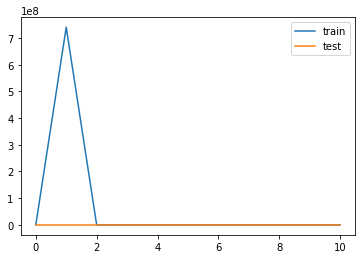

12/12 [==============================] - 2s 114ms/step


(2849, 4)


In [64]:
model_id = 'Deep Learning LSTM'
lstm_model, X_test, y_test, xscaler, yscaler, test_dates = train_model(
                                                                    prep_dsets=prep_dsets, 
                                                                    coin_name=cc, 
                                                                    model_builder=build_LSTM,
                                                                    model_kwargs=dict(
                                                                        num_rnns=2,
                                                                        dim_rnn=128, 
                                                                        dense_units=100, 
                                                                        drop=True, 
                                                                        drop_rate=0.3,
                                                                    ),
                                                                    batch_size=1,
                                                                    n_epochs=30,
                                                                    early_stop=True,
                                                                    patience=10,
                                                                    save=True
                                                                )
lstm_tdf = gen_test_df(
    lstm_model, 
    X_test, y_test, 
    yscaler, 
    ticker=ticker, 
    test_dates=test_dates, 
    lags=timesteps, 
    model_id=model_id, 
    pred_scope=scope
    )
lstm_tdf = filter_test_df(lstm_tdf, ticker, model_id, scope)
plot_model_test(lstm_tdf).show()
lstm_idf = gen_importance_df(lstm_model, dsets[cc], timesteps, ticker, model_id, scope)
plot_importance(lstm_idf)

## BLSTM

Epoch 1/30
2424/2424 - 66s - loss: 0.0041 - mse: 0.0041 - val_loss: 0.0019 - val_mse: 0.0019 - 66s/epoch - 27ms/step
Epoch 2/30
2424/2424 - 62s - loss: 0.0022 - mse: 0.0022 - val_loss: 7.2389e-04 - val_mse: 7.2389e-04 - 62s/epoch - 26ms/step
Epoch 3/30
2424/2424 - 62s - loss: 0.0141 - mse: 0.0141 - val_loss: 0.0505 - val_mse: 0.0505 - 62s/epoch - 25ms/step
Epoch 4/30
2424/2424 - 61s - loss: 0.0241 - mse: 0.0241 - val_loss: 0.0505 - val_mse: 0.0505 - 61s/epoch - 25ms/step
Epoch 5/30
2424/2424 - 61s - loss: 0.0242 - mse: 0.0242 - val_loss: 0.0505 - val_mse: 0.0505 - 61s/epoch - 25ms/step
Epoch 6/30
2424/2424 - 65s - loss: 0.0241 - mse: 0.0241 - val_loss: 0.0505 - val_mse: 0.0505 - 65s/epoch - 27ms/step
Epoch 7/30
2424/2424 - 61s - loss: 0.0242 - mse: 0.0242 - val_loss: 0.0505 - val_mse: 0.0505 - 61s/epoch - 25ms/step
Epoch 8/30
2424/2424 - 61s - loss: 0.0241 - mse: 0.0241 - val_loss: 0.0505 - val_mse: 0.0505 - 61s/epoch - 25ms/step
Epoch 9/30
2424/2424 - 61s - loss: 0.0241 - mse: 0.0241 

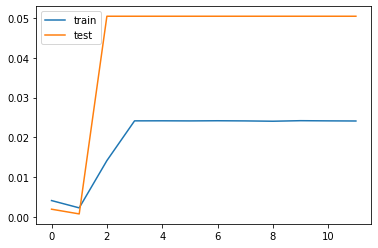

12/12 [==============================] - 1s 15ms/step


(2849, 4)


In [62]:
model_id = 'Bidirectional LSTM'
blstm_model, X_test, y_test, xscaler, yscaler, test_dates = train_model(
                                                                    prep_dsets=prep_dsets, 
                                                                    coin_name=cc, 
                                                                    model_builder=build_BLSTM, 
                                                                    model_kwargs=dict(
                                                                        num_rnns=2,
                                                                        dim_rnn=16, 
                                                                        dense_units=50, 
                                                                        drop=True,
                                                                        drop_rate=0.3
                                                                    ),
                                                                    n_epochs=30,
                                                                    early_stop=True,
                                                                    patience=10,
                                                                    save=True
                                                                )
blstm_tdf = gen_test_df(
    blstm_model, 
    X_test, 
    y_test, 
    yscaler, 
    ticker=ticker, 
    test_dates=test_dates, 
    lags=timesteps, 
    model_id=model_id, 
    pred_scope=scope
    )
blstm_tdf = filter_test_df(
    blstm_tdf, 
    ticker, 
    model_id, 
    scope
    )
plot_model_test(blstm_tdf).show()
blstm_idf = gen_importance_df(
    blstm_model, 
    dsets[cc], 
    timesteps, 
    ticker, 
    model_id, 
    scope
    )
plot_importance(blstm_idf)

In [65]:
lstm_ldf = get_lime_df(lstm_model, 'Deep Learning LSTM', X_train, X_test, dsets, test_dates, ticker, scope, yscaler)
blstm_ldf = get_lime_df(blstm_model, 'Bidirectional LSTM', X_train, X_test, dsets, test_dates, ticker, scope, yscaler)
pd.concat([lstm_ldf, blstm_ldf]).to_csv('./models/other_tested/{}_lime.csv'.format(ticker), index=False)
pd.concat([lstm_idf, blstm_idf]).to_csv('./models/other_tested/{}_fimp.csv'.format(ticker), index=False)
pd.concat([lstm_tdf, blstm_tdf]).to_csv('./models/other_tested/{}_preds.csv'.format(ticker))
plot_lime(lstm_ldf)
plot_lime(blstm_ldf)

157/157 [==============================] - 15s 93ms/step
Intercept 0.05760163274420867
Prediction_local [0.08414198]
Right: 0.14178461
157/157 [==============================] - 15s 96ms/step
Intercept 0.05780906709709965
Prediction_local [0.0848287]
Right: 0.14180416
157/157 [==============================] - 14s 92ms/step
Intercept 0.057801765890272576
Prediction_local [0.08454985]
Right: 0.14196184
157/157 [==============================] - 14s 90ms/step
Intercept 0.05763704895539186
Prediction_local [0.08443645]
Right: 0.14335448
157/157 [==============================] - 14s 91ms/step
Intercept 0.05789162033494335
Prediction_local [0.08631955]
Right: 0.14464834
157/157 [==============================] - 14s 91ms/step
Intercept 0.05751907959402927
Prediction_local [0.08651997]
Right: 0.14518613
157/157 [==============================] - 15s 96ms/step
Intercept 0.05788225992513975
Prediction_local [0.08801652]
Right: 0.14705458
157/157 [==============================] - 16s 99ms/ste

# PPC - 

In [52]:
cc = 'PPC-USD'
timesteps = 60
scope = '1 day ahead'
ticker = cc[:3]
X_train, y_train, X_test, y_test, xscaler, yscaler, test_dates = prep_dsets[cc]
print(X_train.shape, y_train.shape, X_test.shape, y_test.shape)
dsets[cc]

(2424, 60, 4) (2424,) (365, 60, 4) (365,)


,TNX,Gtrend,Volume,Close
Date,,,,
2014-09-17,2.600,29.000000,1547560,1.540270
2014-09-18,2.629,100.000000,3559080,1.685280
2014-09-19,2.587,37.000000,1124210,1.216330
2014-09-20,2.587,26.000000,1751120,1.641050
2014-09-21,2.587,42.000000,1044110,1.488790
...,...,...,...,...
2022-06-24,3.125,0.000000,5516,0.308012
2022-06-25,3.125,19.000000,1118,0.296921
2022-06-26,3.125,0.000000,967,0.296580


Epoch 1/30
2424/2424 - 67s - loss: 0.0036 - mse: 0.0036 - val_loss: 0.0011 - val_mse: 0.0011 - 67s/epoch - 27ms/step
Epoch 2/30
2424/2424 - 60s - loss: 0.0018 - mse: 0.0018 - val_loss: 7.7630e-04 - val_mse: 7.7630e-04 - 60s/epoch - 25ms/step
Epoch 3/30
2424/2424 - 61s - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0011 - val_mse: 0.0011 - 61s/epoch - 25ms/step
Epoch 4/30
2424/2424 - 61s - loss: 0.0010 - mse: 0.0010 - val_loss: 0.0034 - val_mse: 0.0034 - 61s/epoch - 25ms/step
Epoch 5/30
2424/2424 - 63s - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0011 - val_mse: 0.0011 - 63s/epoch - 26ms/step
Epoch 6/30
2424/2424 - 63s - loss: 8.2718e-04 - mse: 8.2718e-04 - val_loss: 0.0010 - val_mse: 0.0010 - 63s/epoch - 26ms/step
Epoch 7/30
2424/2424 - 63s - loss: 9.1552e-04 - mse: 9.1552e-04 - val_loss: 0.0011 - val_mse: 0.0011 - 63s/epoch - 26ms/step
Epoch 8/30
2424/2424 - 61s - loss: 9.5738e-04 - mse: 9.5738e-04 - val_loss: 0.0015 - val_mse: 0.0015 - 61s/epoch - 25ms/step
Epoch 9/30
2424/2424 - 62s - los

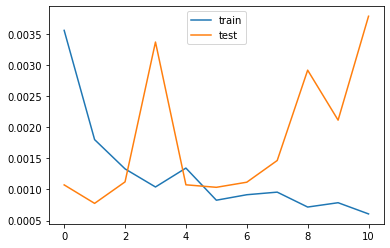

12/12 [==============================] - 1s 16ms/step


(2849, 4)


In [53]:
model_id = 'Bidirectional LSTM'
blstm_model, X_test, y_test, xscaler, yscaler, test_dates = train_model(
                                                                    prep_dsets=prep_dsets, 
                                                                    coin_name=cc, 
                                                                    model_builder=build_BLSTM, 
                                                                    model_kwargs=dict(
                                                                        num_rnns=2,
                                                                        dim_rnn=16, 
                                                                        dense_units=50, 
                                                                        drop=True,
                                                                        drop_rate=0.3
                                                                    ),
                                                                    n_epochs=30,
                                                                    early_stop=True,
                                                                    patience=10,
                                                                    save=True
                                                                )
blstm_tdf = gen_test_df(
    blstm_model, 
    X_test, 
    y_test, 
    yscaler, 
    ticker=ticker, 
    test_dates=test_dates, 
    lags=timesteps, 
    model_id=model_id, 
    pred_scope=scope
    )
blstm_tdf = filter_test_df(
    blstm_tdf, 
    ticker, 
    model_id, 
    scope
    )
plot_model_test(blstm_tdf).show()
blstm_idf = gen_importance_df(
    blstm_model, 
    dsets[cc], 
    timesteps, 
    ticker, 
    model_id, 
    scope
    )
plot_importance(blstm_idf)

Epoch 1/30
2424/2424 - 65s - loss: 0.0030 - mse: 0.0030 - val_loss: 4.2253e-04 - val_mse: 4.2253e-04 - 65s/epoch - 27ms/step
Epoch 2/30
2424/2424 - 64s - loss: 0.0020 - mse: 0.0020 - val_loss: 0.0017 - val_mse: 0.0017 - 64s/epoch - 26ms/step
Epoch 3/30
2424/2424 - 62s - loss: 0.0016 - mse: 0.0016 - val_loss: 3.2314e-04 - val_mse: 3.2314e-04 - 62s/epoch - 26ms/step
Epoch 4/30
2424/2424 - 63s - loss: 0.0013 - mse: 0.0013 - val_loss: 4.2122e-04 - val_mse: 4.2122e-04 - 63s/epoch - 26ms/step
Epoch 5/30
2424/2424 - 62s - loss: 0.0010 - mse: 0.0010 - val_loss: 3.7018e-04 - val_mse: 3.7018e-04 - 62s/epoch - 26ms/step
Epoch 6/30
2424/2424 - 62s - loss: 0.0011 - mse: 0.0011 - val_loss: 1.6731e-04 - val_mse: 1.6731e-04 - 62s/epoch - 26ms/step
Epoch 7/30
2424/2424 - 64s - loss: 0.0011 - mse: 0.0011 - val_loss: 2.8579e-04 - val_mse: 2.8579e-04 - 64s/epoch - 26ms/step
Epoch 8/30
2424/2424 - 63s - loss: 0.0010 - mse: 0.0010 - val_loss: 2.8351e-04 - val_mse: 2.8351e-04 - 63s/epoch - 26ms/step
Epoch 9/

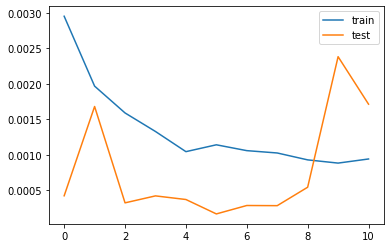

12/12 [==============================] - 1s 15ms/step


(2849, 4)


In [54]:
model_id = 'Bidirectional LSTM'
blstm_model, X_test, y_test, xscaler, yscaler, test_dates = train_model(
                                                                    prep_dsets=prep_dsets, 
                                                                    coin_name=cc, 
                                                                    model_builder=build_BLSTM, 
                                                                    model_kwargs=dict(
                                                                        num_rnns=2,
                                                                        dim_rnn=16, 
                                                                        dense_units=50, 
                                                                        drop=True,
                                                                        drop_rate=0.3
                                                                    ),
                                                                    n_epochs=30,
                                                                    early_stop=True,
                                                                    patience=10,
                                                                    save=True
                                                                )
blstm_tdf = gen_test_df(
    blstm_model, 
    X_test, 
    y_test, 
    yscaler, 
    ticker=ticker, 
    test_dates=test_dates, 
    lags=timesteps, 
    model_id=model_id, 
    pred_scope=scope
    )
blstm_tdf = filter_test_df(
    blstm_tdf, 
    ticker, 
    model_id, 
    scope
    )
plot_model_test(blstm_tdf).show()
blstm_idf = gen_importance_df(
    blstm_model, 
    dsets[cc], 
    timesteps, 
    ticker, 
    model_id, 
    scope
    )
plot_importance(blstm_idf)

In [55]:
lstm_ldf = get_lime_df(lstm_model, 'Deep Learning LSTM', X_train, X_test, dsets, test_dates, ticker, scope, yscaler)
blstm_ldf = get_lime_df(blstm_model, 'Bidirectional LSTM', X_train, X_test, dsets, test_dates, ticker, scope, yscaler)
pd.concat([lstm_ldf, blstm_ldf]).to_csv('./models/other_tested/{}_lime.csv'.format(ticker), index=False)
pd.concat([lstm_idf, blstm_idf]).to_csv('./models/other_tested/{}_fimp.csv'.format(ticker), index=False)
pd.concat([lstm_tdf, blstm_tdf]).to_csv('./models/other_tested/{}_preds.csv'.format(ticker))
plot_lime(lstm_ldf)
plot_lime(blstm_ldf)

157/157 [==============================] - 24s 150ms/step
Intercept 0.058259003536919
Prediction_local [0.08233361]
Right: 0.1196469
157/157 [==============================] - 24s 151ms/step
Intercept 0.05826936568282221
Prediction_local [0.07472486]
Right: 0.11976392
157/157 [==============================] - 25s 161ms/step
Intercept 0.05793478765065951
Prediction_local [0.07372519]
Right: 0.11955798
157/157 [==============================] - 24s 153ms/step
Intercept 0.0576871080579177
Prediction_local [0.07404581]
Right: 0.1196289
157/157 [==============================] - 25s 160ms/step
Intercept 0.057561023214551726
Prediction_local [0.07314665]
Right: 0.119989745
157/157 [==============================] - 24s 156ms/step
Intercept 0.057499565519186
Prediction_local [0.07485503]
Right: 0.12056019
157/157 [==============================] - 25s 161ms/step
Intercept 0.058201358395183096
Prediction_local [0.07481671]
Right: 0.12110829
157/157 [==============================] - 25s 157ms

KeyboardInterrupt: 

# FTC - FeatherCoin

In [66]:
cc = 'FTC-USD'
timesteps = 60
scope = '1 day ahead'
ticker = cc[:3]
X_train, y_train, X_test, y_test, xscaler, yscaler, test_dates = prep_dsets[cc]
print(X_train.shape, y_train.shape, X_test.shape, y_test.shape)
dsets[cc]

(2424, 60, 4) (2424,) (365, 60, 4) (365,)


,FVX,Gtrend,Volume,Close
Date,,,,
2014-09-17,1.804,23.000000,55508,0.031977
2014-09-18,1.841,11.000000,79990,0.038074
2014-09-19,1.819,0.000000,23775,0.027994
2014-09-20,1.819,14.000000,47853,0.040424
2014-09-21,1.819,26.000000,14575,0.028920
...,...,...,...,...
2022-06-24,3.175,0.000000,0,0.006876
2022-06-25,3.175,0.000000,0,0.007064
2022-06-26,3.175,0.000000,0,0.006922


Epoch 1/30
2424/2424 - 66s - loss: 0.0037 - mse: 0.0037 - val_loss: 5.9424e-04 - val_mse: 5.9424e-04 - 66s/epoch - 27ms/step
Epoch 2/30
2424/2424 - 61s - loss: 382007744.0000 - mse: 382007744.0000 - val_loss: 5.9522e-04 - val_mse: 5.9522e-04 - 61s/epoch - 25ms/step
Epoch 3/30
2424/2424 - 60s - loss: 0.0046 - mse: 0.0046 - val_loss: 4.9114e-04 - val_mse: 4.9114e-04 - 60s/epoch - 25ms/step
Epoch 4/30
2424/2424 - 60s - loss: 0.0016 - mse: 0.0016 - val_loss: 4.6783e-05 - val_mse: 4.6783e-05 - 60s/epoch - 25ms/step
Epoch 5/30
2424/2424 - 60s - loss: 0.0014 - mse: 0.0014 - val_loss: 2.3121e-04 - val_mse: 2.3121e-04 - 60s/epoch - 25ms/step
Epoch 6/30
2424/2424 - 63s - loss: 0.0013 - mse: 0.0013 - val_loss: 1.5579e-04 - val_mse: 1.5579e-04 - 63s/epoch - 26ms/step
Epoch 7/30
2424/2424 - 61s - loss: 0.0012 - mse: 0.0012 - val_loss: 5.9552e-04 - val_mse: 5.9552e-04 - 61s/epoch - 25ms/step
Epoch 8/30
2424/2424 - 61s - loss: 9.3776e-04 - mse: 9.3776e-04 - val_loss: 1.9259e-04 - val_mse: 1.9259e-04 

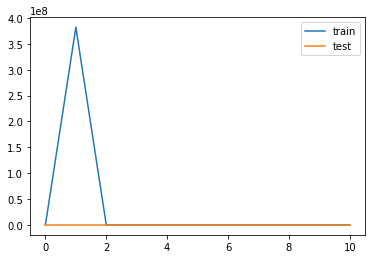

12/12 [==============================] - 1s 16ms/step


(2849, 4)


In [67]:
model_id = 'Bidirectional LSTM'
blstm_model, X_test, y_test, xscaler, yscaler, test_dates = train_model(
                                                                    prep_dsets=prep_dsets, 
                                                                    coin_name=cc, 
                                                                    model_builder=build_BLSTM, 
                                                                    model_kwargs=dict(
                                                                        num_rnns=2,
                                                                        dim_rnn=16, 
                                                                        dense_units=50, 
                                                                        drop=True,
                                                                        drop_rate=0.3
                                                                    ),
                                                                    n_epochs=30,
                                                                    early_stop=True,
                                                                    patience=10,
                                                                    save=True
                                                                )
blstm_tdf = gen_test_df(
    blstm_model, 
    X_test, 
    y_test, 
    yscaler, 
    ticker=ticker, 
    test_dates=test_dates, 
    lags=timesteps, 
    model_id=model_id, 
    pred_scope=scope
    )
blstm_tdf = filter_test_df(
    blstm_tdf, 
    ticker, 
    model_id, 
    scope
    )
plot_model_test(blstm_tdf).show()
blstm_idf = gen_importance_df(
    blstm_model, 
    dsets[cc], 
    timesteps, 
    ticker, 
    model_id, 
    scope
    )
plot_importance(blstm_idf)

In [68]:
model_id = 'Bidirectional LSTM'
blstm_model, X_test, y_test, xscaler, yscaler, test_dates = train_model(
                                                                    prep_dsets=prep_dsets, 
                                                                    coin_name=cc, 
                                                                    model_builder=build_BLSTM, 
                                                                    model_kwargs=dict(
                                                                        num_rnns=2,
                                                                        dim_rnn=16, 
                                                                        dense_units=50, 
                                                                        drop=True,
                                                                        drop_rate=0.3
                                                                    ),
                                                                    n_epochs=30,
                                                                    early_stop=True,
                                                                    patience=10,
                                                                    save=True
                                                                )
blstm_tdf = gen_test_df(
    blstm_model, 
    X_test, 
    y_test, 
    yscaler, 
    ticker=ticker, 
    test_dates=test_dates, 
    lags=timesteps, 
    model_id=model_id, 
    pred_scope=scope
    )
blstm_tdf = filter_test_df(
    blstm_tdf, 
    ticker, 
    model_id, 
    scope
    )
plot_model_test(blstm_tdf).show()
blstm_idf = gen_importance_df(
    blstm_model, 
    dsets[cc], 
    timesteps, 
    ticker, 
    model_id, 
    scope
    )
plot_importance(blstm_idf)

Epoch 1/30


KeyboardInterrupt: 

In [ ]:
lstm_ldf = get_lime_df(lstm_model, 'Deep Learning LSTM', X_train, X_test, dsets, test_dates, ticker, scope, yscaler)
blstm_ldf = get_lime_df(blstm_model, 'Bidirectional LSTM', X_train, X_test, dsets, test_dates, ticker, scope, yscaler)
pd.concat([lstm_ldf, blstm_ldf]).to_csv('./models/other_tested/{}_lime.csv'.format(ticker), index=False)
pd.concat([lstm_idf, blstm_idf]).to_csv('./models/other_tested/{}_fimp.csv'.format(ticker), index=False)
pd.concat([lstm_tdf, blstm_tdf]).to_csv('./models/other_tested/{}_preds.csv'.format(ticker))
plot_lime(lstm_ldf)
plot_lime(blstm_ldf)

# Tweets Sentiment

In [73]:
from app.api import Twitter
twt = Twitter()
twt.get_tweets_df('bitcoin OR BTC', limit=50, popular=True)

,id,created_at,full_text,truncated,retweets,user_name,user_verified,user_followers,user_image_url
0,1542672286490271744,Fri Jul 01 00:51:49 +0000 2022,"El Salvador bought today 80 #BTC at $19,000 ea...",False,5835,nayibbukele,True,4063660,http://pbs.twimg.com/profile_images/1525302975...
1,1542434035624034304,Thu Jun 30 09:05:05 +0000 2022,"If #Bitcoin hits $18,000 in the next 24hrs, I ...",False,7913,OfficialTravlad,True,316253,http://pbs.twimg.com/profile_images/1542527100...
2,1542478782048641026,Thu Jun 30 12:02:54 +0000 2022,#Bitcoin is never boring.,False,2149,saylor,True,2602944,http://pbs.twimg.com/profile_images/1485632175...
3,1542484760907419649,Thu Jun 30 12:26:39 +0000 2022,The Bank of International Settlements proposed...,False,991,BitcoinMagazine,True,2550197,http://pbs.twimg.com/profile_images/1444022922...
4,1542473062385389569,Thu Jun 30 11:40:10 +0000 2022,JUST IN: Bank of International Settlements pro...,False,1036,BitcoinMagazine,True,2550197,http://pbs.twimg.com/profile_images/1444022922...
5,1542848684068577283,Fri Jul 01 12:32:45 +0000 2022,"If you love nothing, nothing will love you bac...",False,971,saylor,True,2602944,http://pbs.twimg.com/profile_images/1485632175...
6,1542554873970966528,Thu Jun 30 17:05:15 +0000 2022,Deutsche Bank predicts #Bitcoin will reclaim $...,False,740,WatcherGuru,True,1203087,http://pbs.twimg.com/profile_images/1475973046...
7,1542539624136032257,Thu Jun 30 16:04:40 +0000 2022,Who do you trust? #Bitcoin https://t.co/ztTwvK...,False,1319,saylor,True,2602944,http://pbs.twimg.com/profile_images/1485632175...
8,1542424700814491648,Thu Jun 30 08:28:00 +0000 2022,"If #Bitcoin ever goes below $10,000 I will giv...",False,891,rovercrc,True,263017,http://pbs.twimg.com/profile_images/1492942875...
9,1542673316665769984,Fri Jul 01 00:55:54 +0000 2022,BREAKING: El Salvador bought 80 more #bitcoin 🇸🇻,False,980,BitcoinMagazine,True,2550197,http://pbs.twimg.com/profile_images/1444022922...


In [1]:
%pip install netron

Note: you may need to restart the kernel to use updated packages.


In [2]:
import netron
netron.start('./models/BTC_Bidirectional_LSTM_60_lags_4_fts.json')

Serving './models/BTC_Bidirectional_LSTM_60_lags_4_fts.json' at http://localhost:8080


('localhost', 8080)

# Models Fine-Tuning

In [60]:
import os
import pandas as pd

coins = {
    'BTC': 'BTC - Bitcoin',
    'ETH': 'ETH - Ethereum',
    'LTC': 'LTC - Litecoin',
    'NMC': 'NMC - Namecoin',
}

pred_dfs = []
fi_dfs = []
lime_dfs = []

for file in os.listdir('./models/other_tested/'):
    
    if 'preds.csv' in file:
        print(file)
        ticker = file[:3]
        df = pd.read_csv('./models/other_tested/' + file)
        print(df.shape)
        df['Coin'] = coins[ticker]
        df['Scope'] = '1 day ahead'
        df.loc[:int(df.shape[1]/2), 'Model'] = 'Deep Learning LSTM'
        df.loc[int(df.shape[1]/2):, 'Model'] = 'Bidirectional LSTM'
        pred_dfs.append(df)
    elif 'fimp.csv' in file:
        ticker = file[:3]
        df = pd.read_csv('./models/other_tested/' + file)
        df['Coin'] = coins[ticker]
        df['Scope'] = '1 day ahead'
        df.loc[:int(df.shape[1]/2), 'Model'] = 'Deep Learning LSTM'
        df.loc[int(df.shape[1]/2):, 'Model'] = 'Bidirectional LSTM'
        fi_dfs.append(df)
    elif 'lime.csv' in file:
        lime_dfs.append(pd.read_csv('./models/other_tested/' + file))
    else: continue

ETH_preds.csv
(240, 3)
LTC_preds.csv
(730, 3)
NMC_preds.csv
(730, 3)


In [90]:
eth_p2 = pd.read_csv('./models/other_tested/NMC_preds.csv', parse_dates=['Date'], index_col='Date')[:365]
eth_p2['Coin'] = 'NMC - Namecoin'
eth_p2['Model'] = 'Deep Learning LSTM'
eth_p2['Scope'] = '1 day ahead'
plot_model_test(eth_p2[['Observed', 'Predicted']])

In [65]:
ready_p.append(eth_p1)

In [91]:
ready_p.append(eth_p2)

In [94]:
btc_preds = pd.read_csv('./app/dashboard/test_models/predictions.csv', parse_dates=['Date'], index_col='Date')
btc_preds = btc_preds[btc_preds['Coin']=='BTC - Bitcoin']
btc_preds.drop(columns=['Unnamed: 0'], inplace=True)
btc_preds

,Observed,Predicted,Coin,Scope,Model
Date,,,,,
2021-06-25,31637.779297,32939.936828,BTC - Bitcoin,1 day ahead,Deep Learning LSTM
2021-06-26,32186.277344,32518.892256,BTC - Bitcoin,1 day ahead,Deep Learning LSTM
2021-06-27,34649.644531,32285.149538,BTC - Bitcoin,1 day ahead,Deep Learning LSTM
2021-06-28,34434.335938,33112.409094,BTC - Bitcoin,1 day ahead,Deep Learning LSTM
2021-06-29,35867.777344,33811.432093,BTC - Bitcoin,1 day ahead,Deep Learning LSTM
...,...,...,...,...,...
2022-06-19,20553.271484,19954.364565,BTC - Bitcoin,1 day ahead,Bidirectional LSTM
2022-06-20,20599.537109,19868.319224,BTC - Bitcoin,1 day ahead,Bidirectional LSTM
2022-06-21,20710.597656,19741.817872,BTC - Bitcoin,1 day ahead,Bidirectional LSTM


In [95]:
pred_final = pd.concat([btc_preds] + ready_p )
pred_final

,Observed,Predicted,Coin,Scope,Model
Date,,,,,
2021-06-25,31637.779297,32939.936828,BTC - Bitcoin,1 day ahead,Deep Learning LSTM
2021-06-26,32186.277344,32518.892256,BTC - Bitcoin,1 day ahead,Deep Learning LSTM
2021-06-27,34649.644531,32285.149538,BTC - Bitcoin,1 day ahead,Deep Learning LSTM
2021-06-28,34434.335938,33112.409094,BTC - Bitcoin,1 day ahead,Deep Learning LSTM
2021-06-29,35867.777344,33811.432093,BTC - Bitcoin,1 day ahead,Deep Learning LSTM
...,...,...,...,...,...
2022-06-24,1.361111,0.749784,NMC - Namecoin,1 day ahead,Deep Learning LSTM
2022-06-25,1.405799,0.725639,NMC - Namecoin,1 day ahead,Deep Learning LSTM
2022-06-26,1.390472,0.719497,NMC - Namecoin,1 day ahead,Deep Learning LSTM


In [96]:
pred_final.to_csv('./app/dashboard/test_models/predictions.csv')

In [106]:
lime_df = pd.read_csv('./app/dashboard/test_models/lime.csv')
lime_df.drop(columns=['Unnamed: 0'], inplace=True)
lime_df.to_csv('./app/dashboard/test_models/lime.csv', index=False)

In [36]:
import pandas as pd
pred_bad_btc = pd.read_csv('./app/dashboard/test_models/ft_importance.csv').drop(columns=['Unnamed: 0'])
btc_coins = ["BTC - Bitcoin", "BTC-Bitcoin"]
no_btc = pred_bad_btc.query('Ticker != "BTC"')
no_btc

,Feature,Importance,Metric,Ticker,Model,Scope,Coin
0,Gtrend t-2,-0.000358,mae,ETH,Deep Learning LSTM,1 day ahead,ETH - Ethereum
1,Close t-9,-0.000263,mae,ETH,Deep Learning LSTM,1 day ahead,ETH - Ethereum
2,Gtrend t-1,-0.000238,mae,ETH,Deep Learning LSTM,1 day ahead,ETH - Ethereum
3,Volume t-3,-0.000193,mae,ETH,Bidirectional LSTM,1 day ahead,ETH - Ethereum
4,Volume t-1,-0.000174,mae,ETH,Bidirectional LSTM,1 day ahead,ETH - Ethereum
...,...,...,...,...,...,...,...
2875,FVX t-2,0.000017,mse,NMC,Bidirectional LSTM,1 day ahead,NMC - Namecoin
2876,FVX t-3,0.000020,mse,NMC,Bidirectional LSTM,1 day ahead,NMC - Namecoin
2877,Close t-2,0.000030,mse,NMC,Bidirectional LSTM,1 day ahead,NMC - Namecoin
2878,FVX t-1,0.000041,mse,NMC,Bidirectional LSTM,1 day ahead,NMC - Namecoin


In [39]:
new_btc = pd.read_csv('./models/ft_importance.csv').drop(columns=['Unnamed: 0'])
new_btc

,Feature,Importance,Metric,Ticker,Model,Scope
0,Close t-2,-0.000036,mae,BTC,Deep Learning LSTM,1 day ahead
1,Close t-1,-0.000033,mae,BTC,Deep Learning LSTM,1 day ahead
2,Close t-3,-0.000021,mae,BTC,Deep Learning LSTM,1 day ahead
3,Gtrend t-1,-0.000018,mae,BTC,Deep Learning LSTM,1 day ahead
4,Gtrend t-3,-0.000014,mae,BTC,Deep Learning LSTM,1 day ahead
...,...,...,...,...,...,...
955,Close t-4,0.000029,mse,BTC,Bidirectional LSTM,1 day ahead
956,TYX t-2,0.000051,mse,BTC,Bidirectional LSTM,1 day ahead
957,Close t-3,0.000964,mse,BTC,Bidirectional LSTM,1 day ahead
958,Close t-2,0.004039,mse,BTC,Bidirectional LSTM,1 day ahead


In [42]:
all_idfs = pd.concat([lstm_idf, bblstm_idf, no_btc])
all_idfs['Coin']= all_idfs['Coin'].fillna('BTC - Bitcoin')
all_idfs.to_csv('./app/dashboard/test_models/ft_importance.csv', index=False)

In [45]:
all_idfs.query('Ticker=="ETH"')

,Feature,Importance,Metric,Ticker,Model,Scope,Coin
0,Gtrend t-2,-0.000358,mae,ETH,Deep Learning LSTM,1 day ahead,ETH - Ethereum
1,Close t-9,-0.000263,mae,ETH,Deep Learning LSTM,1 day ahead,ETH - Ethereum
2,Gtrend t-1,-0.000238,mae,ETH,Deep Learning LSTM,1 day ahead,ETH - Ethereum
3,Volume t-3,-0.000193,mae,ETH,Bidirectional LSTM,1 day ahead,ETH - Ethereum
4,Volume t-1,-0.000174,mae,ETH,Bidirectional LSTM,1 day ahead,ETH - Ethereum
...,...,...,...,...,...,...,...
955,Close t-4,0.000049,mse,ETH,Bidirectional LSTM,1 day ahead,ETH - Ethereum
956,FVX t-2,0.000056,mse,ETH,Bidirectional LSTM,1 day ahead,ETH - Ethereum
957,Close t-3,0.000294,mse,ETH,Bidirectional LSTM,1 day ahead,ETH - Ethereum
958,Close t-2,0.001797,mse,ETH,Bidirectional LSTM,1 day ahead,ETH - Ethereum


In [2]:
from app.modules.lstm import get_prediction
from app.modules import models_meta

In [3]:
get_prediction(
        models_meta.pred_models,
        'ETH - Ethereum', 
        'Bidirectional LSTM',
        '1 day ahead',
        './app/dashboard/test_models/', 
        './app/dashboard/test_models/scalers/'
        )

[*********************100%***********************]  1 of 1 completed
got treasury data
[*********************100%***********************]  1 of 1 completed
got coin mkt data
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 62 entries, 2022-05-03 to 2022-07-03
Data columns (total 6 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Open       62 non-null     float64
 1   High       62 non-null     float64
 2   Low        62 non-null     float64
 3   Close      62 non-null     float64
 4   Adj Close  62 non-null     float64
 5   Volume     62 non-null     int64  
dtypes: float64(5), int64(1)
memory usage: 3.4 KB
None
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 60 entries, 2022-05-05 to 2022-07-03
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Volume  60 non-null     int64  
 1   Close   60 non-null     float64
 2   FVX     40 non-null     float64
dtypes: float64(2), in

1018.0153